In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (3).json


{'kaggle.json': b'{"username":"saikoushikpentyala","key":"1ddca6d8ac32ded7f92b733d9bc7584d"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle

kaggle.json


In [ ]:
!ls -l ~/.kaggle
!cat ~/.kaggle/kaggle.json

total 4
-rw------- 1 root root 74 May  9 02:40 kaggle.json
{"username":"saikoushikpentyala","key":"1ddca6d8ac32ded7f92b733d9bc7584d"}

In [ ]:
!sudo apt-get install python-lxml

Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-lxml is already the newest version (4.5.0-1ubuntu0.5).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
!pip install -q kaggle

In [ ]:
!kaggle datasets download -d moltean/fruits

fruits.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip fruits.zip

Streaming output truncated to the last 5000 lines.
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/112_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/113_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/114_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/115_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/116_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/117_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/119_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/120_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/121_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/122_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/123_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Training/Tomato 3/124_100.jpg  
  inflating: fruits-360_dataset/fruits-360/Traini

In [ ]:
import tensorflow as tf
from __future__ import absolute_import, division, print_function, unicode_literals
print("Keras Version: ", tf.keras.__version__)

Keras Version:  2.12.0


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
train_dir = '/content/fruits-360_dataset/fruits-360/Training'

In [ ]:
test_dir = '/content/fruits-360_dataset/fruits-360/Test'

#load these images off disk using image_dataset_from_directory
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory Old solution: Use ImageDataGenerator to rescale the images: https://keras.io/preprocessing/image/

In [ ]:
base_dir = '/'
print(base_dir)

/


In [ ]:
batch_size = 32
img_height = 128 #180
img_width = 128 #180

In [ ]:
# Establishes a Pipe line instead of loading the dataset directly
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  train_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 67692 files belonging to 131 classes.
Using 54154 files for training.


In [ ]:
# Establishes a Pipe line instead of loading the dataset directly
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  test_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)



Found 22688 files belonging to 131 classes.
Using 18151 files for training.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
class_names = train_ds.class_names
print(class_names)


['Apple Braeburn', 'Apple Crimson Snow', 'Apple Golden 1', 'Apple Golden 2', 'Apple Golden 3', 'Apple Granny Smith', 'Apple Pink Lady', 'Apple Red 1', 'Apple Red 2', 'Apple Red 3', 'Apple Red Delicious', 'Apple Red Yellow 1', 'Apple Red Yellow 2', 'Apricot', 'Avocado', 'Avocado ripe', 'Banana', 'Banana Lady Finger', 'Banana Red', 'Beetroot', 'Blueberry', 'Cactus fruit', 'Cantaloupe 1', 'Cantaloupe 2', 'Carambula', 'Cauliflower', 'Cherry 1', 'Cherry 2', 'Cherry Rainier', 'Cherry Wax Black', 'Cherry Wax Red', 'Cherry Wax Yellow', 'Chestnut', 'Clementine', 'Cocos', 'Corn', 'Corn Husk', 'Cucumber Ripe', 'Cucumber Ripe 2', 'Dates', 'Eggplant', 'Fig', 'Ginger Root', 'Granadilla', 'Grape Blue', 'Grape Pink', 'Grape White', 'Grape White 2', 'Grape White 3', 'Grape White 4', 'Grapefruit Pink', 'Grapefruit White', 'Guava', 'Hazelnut', 'Huckleberry', 'Kaki', 'Kiwi', 'Kohlrabi', 'Kumquats', 'Lemon', 'Lemon Meyer', 'Limes', 'Lychee', 'Mandarine', 'Mango', 'Mango Red', 'Mangostan', 'Maracuja', 'Melo

In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  train_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 67692 files belonging to 131 classes.
Using 13538 files for validation.


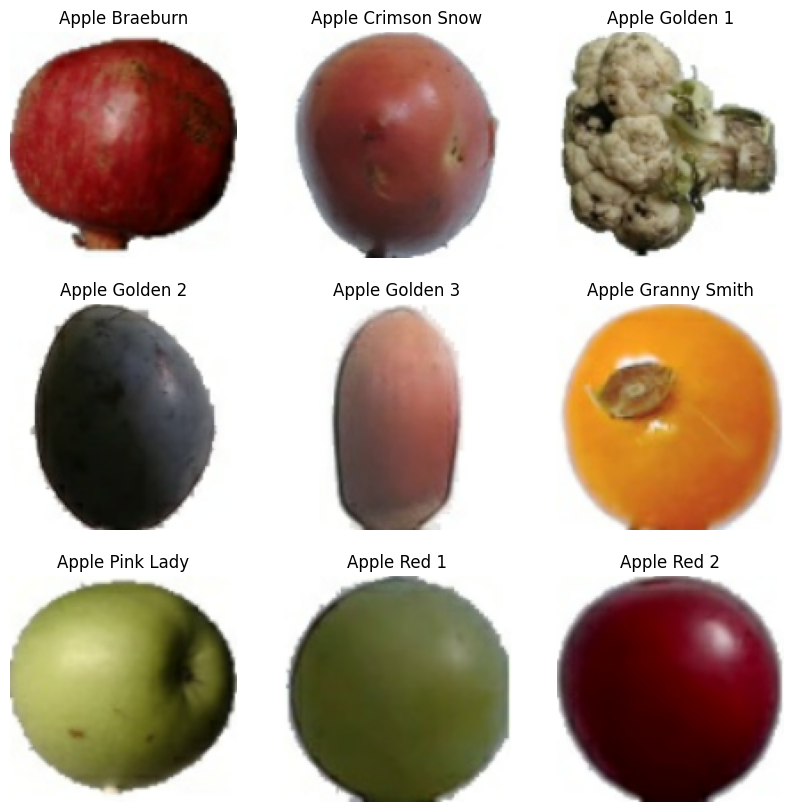

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, groundlabels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[i])
    plt.axis("off")

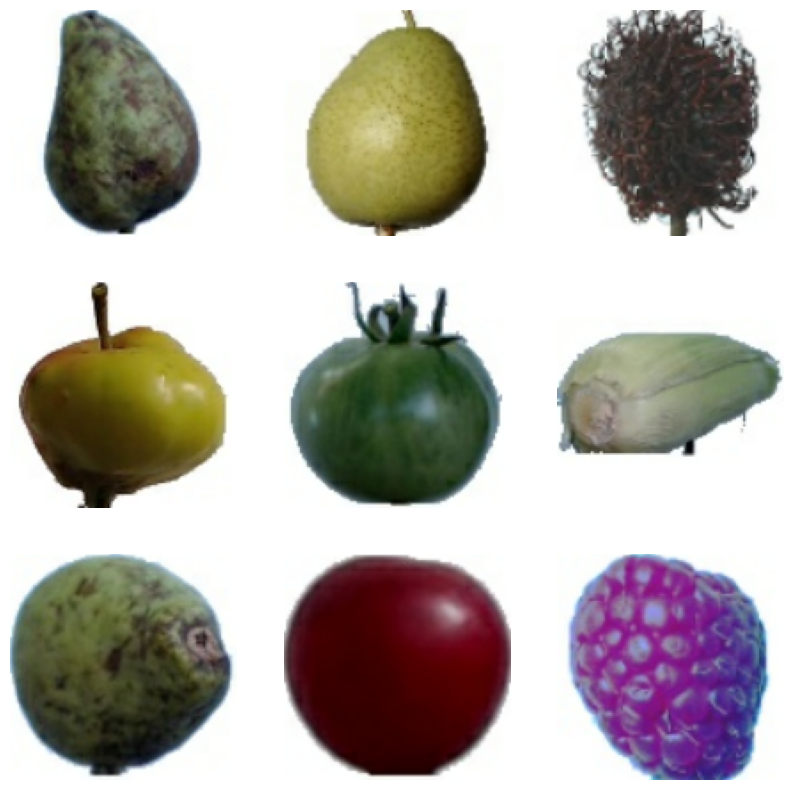

In [ ]:
## test images
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, groundlabels in test_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.axis("off")

In [ ]:
#manually iterate over the dataset and retrieve batches of images:
#This is a batch of 32 images of shape 180x180x3 (the last dimension referes to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 128, 128, 3)
(32,)


In [ ]:
# number of batches
train_ds.cardinality().numpy()
test_ds.cardinality().numpy()


20

In [ ]:
batch_size = 32
img_height = 128
img_width = 128
IMG_SIZE = (img_height, img_width)
IMG_SHAPE = IMG_SIZE + (3,)
num_classes = 131

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
def getModel(base_model,preprocess_input):
    batch_size = 32
    img_height = 128
    img_width = 128
    IMG_SIZE = (img_height, img_width)
    IMG_SHAPE = IMG_SIZE + (3,)
    num_classes = 131
    
    data_augmentation = tf.keras.Sequential([
      tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
      tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    ])
    

    base_model.trainable = False
    
    header = tf.keras.Sequential([
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(num_classes, activation='softmax', dtype=tf.float32) 
    ])
    
    inputs = tf.keras.Input(shape=IMG_SHAPE)
    x = data_augmentation(inputs)
    x = preprocess_input(x)
    x = base_model(x, training=False)
    outputs = header(x)
    model = tf.keras.Model(inputs, outputs)
    base_learning_rate = 0.0001
    model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              #loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
    return model

In [ ]:
def getFineTuneModel(model,fine_tune_at):
  model_base=model.layers[2]
  for layer in model.layers[2].layers[fine_tune_at:]:
    layer.trainable =  True
  base_learning_rate = 0.0001
  model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate/10),
          #loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
          loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
          metrics=['accuracy'])
  return model

In [ ]:
def plot_history(history, metric, val_metric):
  acc = history.history[metric]
  val_acc = history.history[val_metric]
  loss=history.history['loss']
  val_loss=history.history['val_loss']
  epochs_range = range(len(acc))
  fig=plt.figure(figsize=(12, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylim([min(plt.ylim()),1])
  plt.grid(True)
  plt.title('Training and Validation Accuracy')
  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.grid(True)
  plt.title('Training and Validation Loss')
  plt.show()
  fig.savefig('traininghistory.pdf')
# plot_history('history','accuracy','val_accuracy')

In [ ]:
def plotHistoryFinetune(history,history_finetune,initial_epochs):
  acc = history.history['accuracy']
  acc += history_finetune.history['accuracy']

  val_acc = history.history['val_accuracy']
  val_acc += history_finetune.history['val_accuracy']

  loss = history.history['loss']
  loss += history_finetune.history['loss']

  val_loss = history.history['val_loss']
  val_loss += history_finetune.history['val_loss']

  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.ylim([0.8, 1])
  plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.ylim([0, 1.0])
  plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()


In [ ]:
def trainTLModel(base_model,preprocess_input,fine_tune_at,train_ds,val_ds):
  model = getModel(base_model,preprocess_input)
  newModel = model
  fineTuneModel = getFineTuneModel(newModel,fine_tune_at)
  # Transfer Learning:
  #loss0, accuracy0 = model.evaluate(val_ds)
  history = model.fit(train_ds,
                    epochs=15,
                    validation_data=val_ds)
  #Fine Tuning
  #loss1, accuracy1 = fineTuneModel.evaluate(val_ds)
  fine_tune_epochs = 15
  initial_epochs = 15
  total_epochs =  initial_epochs + fine_tune_epochs
  history_finetune = fineTuneModel.fit(train_ds,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_ds)
  plotHistoryFinetune(history,history_finetune,initial_epochs)
  return [history,history_finetune,model,fineTuneModel]


In [ ]:
efficientnet_v2_model = tf.keras.applications.efficientnet_v2.EfficientNetV2L(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')
preprocess_input =  tf.keras.applications.efficientnet_v2.preprocess_input



In [ ]:
efficientnet_v2_model.summary()

Model: "efficientnetv2-l"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 128, 128, 3)  0           ['input_1[0][0]']                
                                                                                                  
 stem_conv (Conv2D)             (None, 64, 64, 32)   864         ['rescaling[0][0]']              
                                                                                                  
 stem_bn (BatchNormalization)   (None, 64, 64, 32)   128         ['stem_conv[0][0]'

In [ ]:
efficientnet_v2_tl_model = getModel(efficientnet_v2_model,preprocess_input)

In [ ]:
efficientnet_v2_tl_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 efficientnetv2-l (Functiona  (None, 4, 4, 1280)       117746848 
 l)                                                              
                                                                 
 sequential_1 (Sequential)   (None, 131)               167811    
                                                                 
Total params: 117,914,659
Trainable params: 167,811
Non-trainable params: 117,746,848
_________________________________________________________________


Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1693/1693 [==============================] - 102s 44ms/step - loss: 0.7194 - accuracy: 0.8797 - val_loss: 0.2084 - val_accuracy: 0.9754
Epoch 2/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.1305 - accuracy: 0.9829 - val_loss: 0.0867 - val_accuracy: 0.9920
Epoch 3/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.0680 - accuracy: 0.9916 - val_loss: 0.0482 - val_accuracy: 0.9960
Epoch 4/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.0434 - accuracy: 0.9944 - val_loss: 0.0306 - val_accuracy: 0.9979
Epoch 5/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.0317 - accuracy: 0.9953 - val_loss: 0.0229 - val_accuracy: 0.9984
Epoch 6/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.0236 - accuracy: 0.9967 - val_loss: 0.0186 - val_accuracy: 0.9972
Epoch 7/15
1693/1693 [==============================] - 63s 37ms/step - loss: 0.0194 - accuracy: 0.9970 - val_loss: 0.0126 - val_accur

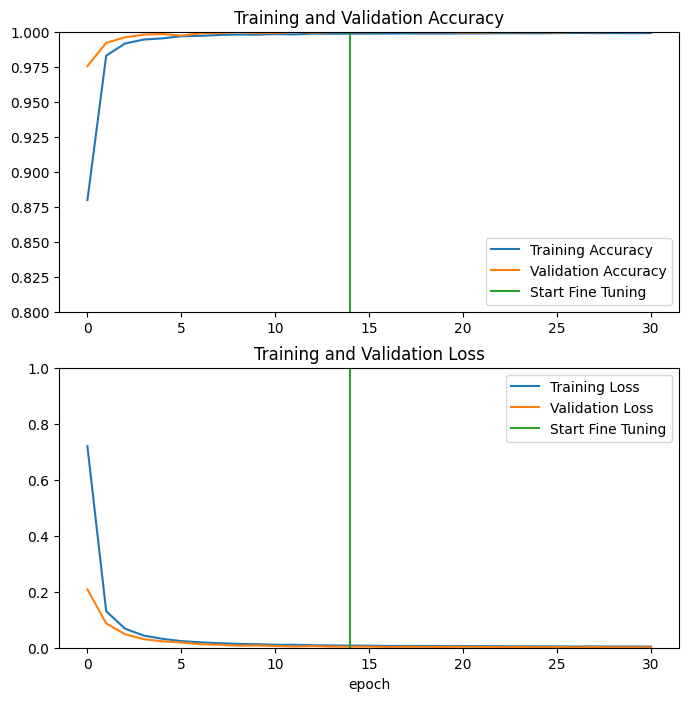

In [ ]:
[history,history_finetune,tl_model,fineTuneModel] = trainTLModel(efficientnet_v2_model,preprocess_input,100,train_ds,val_ds)

In [ ]:
import numpy as np
np.save('resnet_finetunehistory.npy',history_finetune.history)
np.save('resnet_tl_history.npy',history.history)

In [ ]:
fineTuneModel.save('saved_models/efficientnet_v2_finetune/', save_format='tf')

20/20 [==============================] - 8s 29ms/step


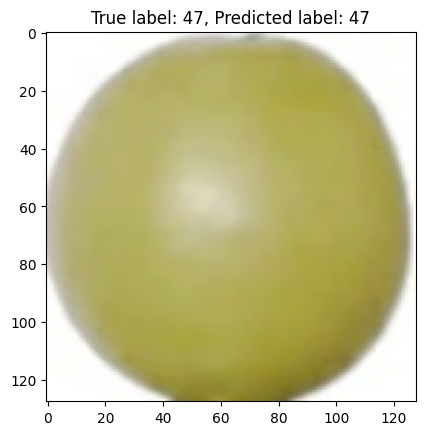

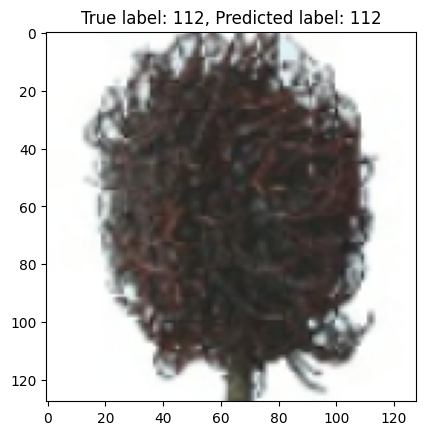

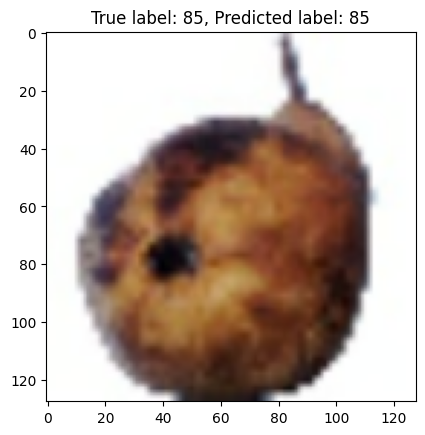

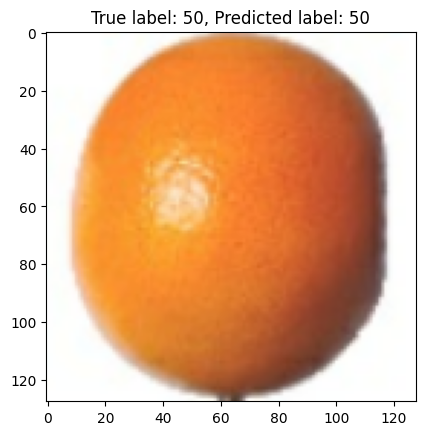

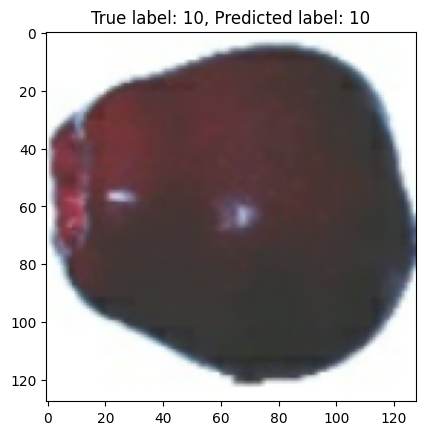

...

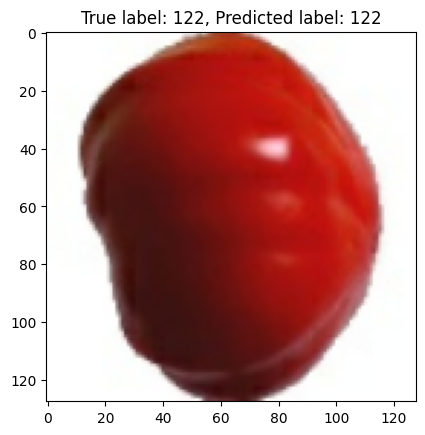

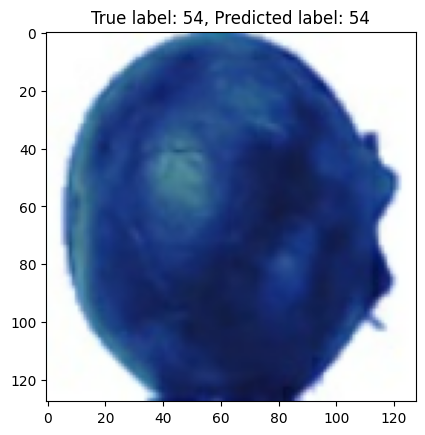

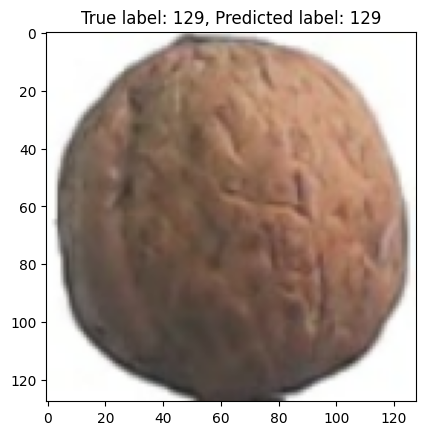

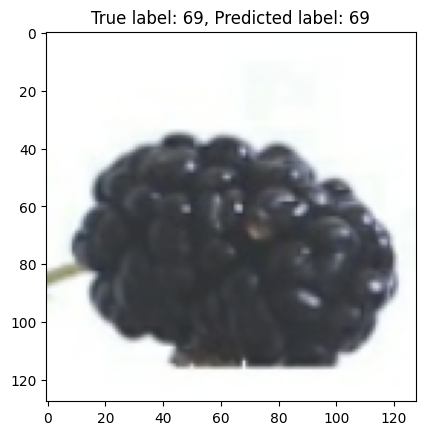

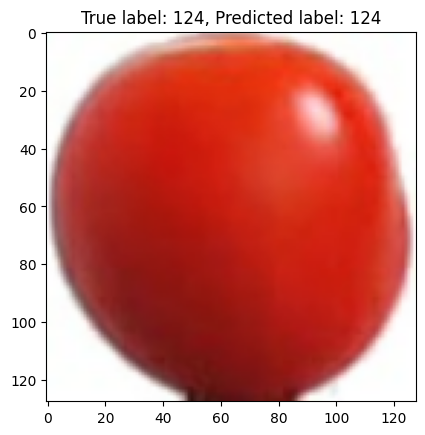

In [ ]:
# Generate predictions using the fine-tuned model
y_pred = fineTuneModel.predict(test_ds)

# Convert predictions to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Print the images and their corresponding labels
for images, labels in test_ds.take(1):
    for i in range(len(images)):
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"True label: {labels[i]}, Predicted label: {y_pred_labels[i]}")
        plt.show()

20/20 [==============================] - 1s 28ms/step


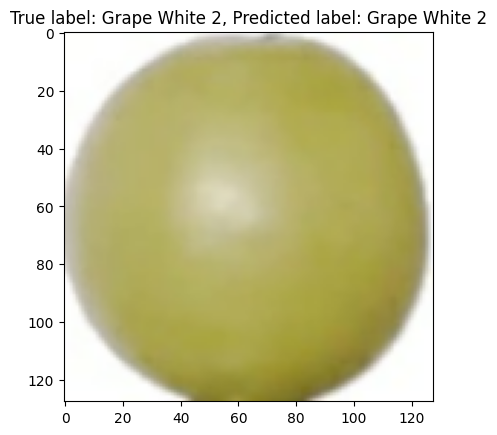

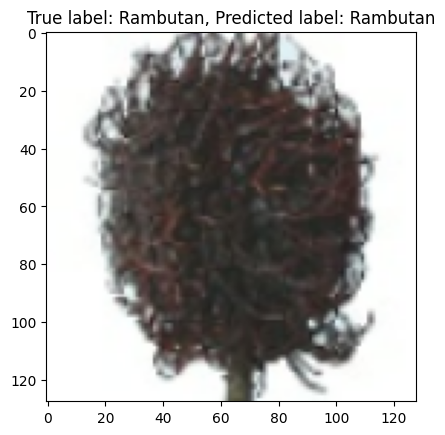

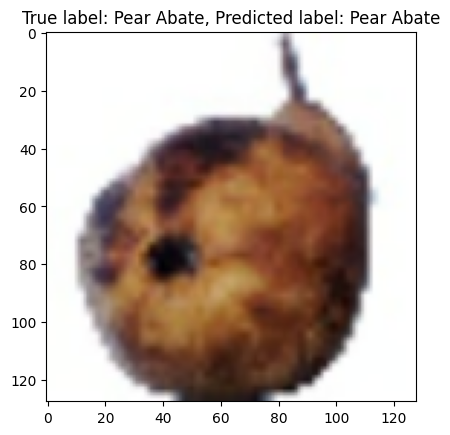

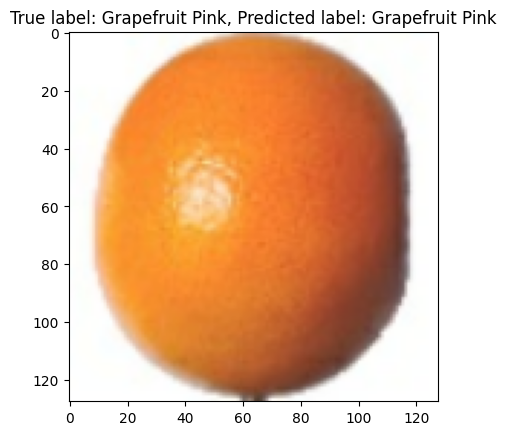

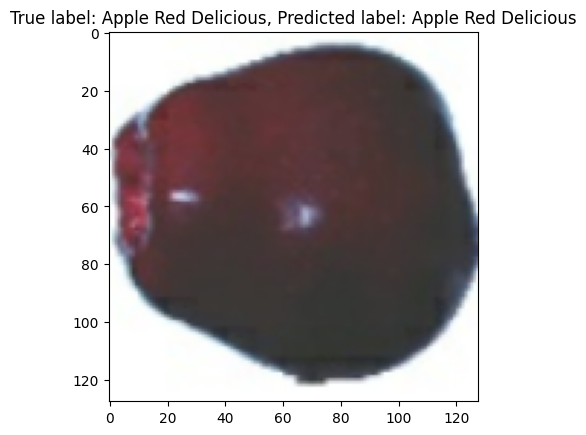

...

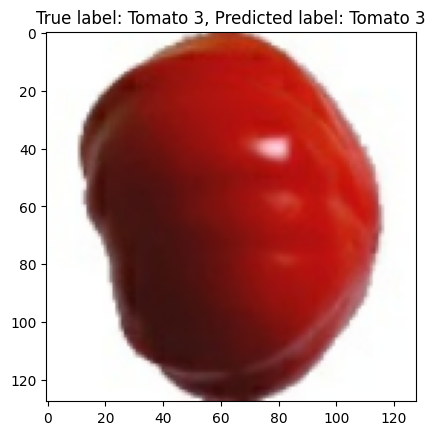

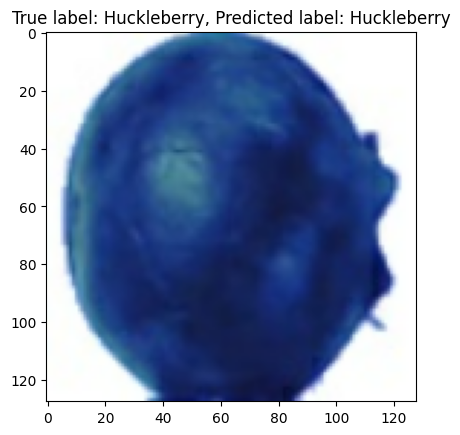

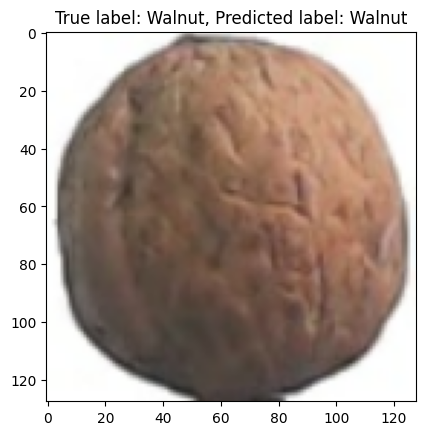

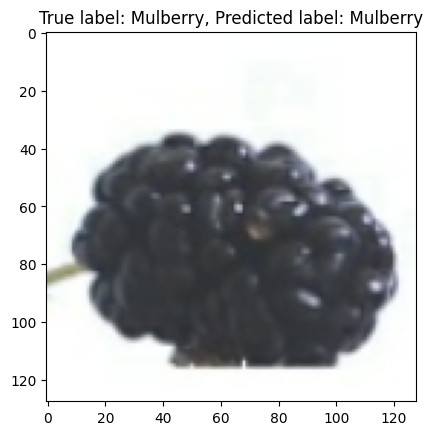

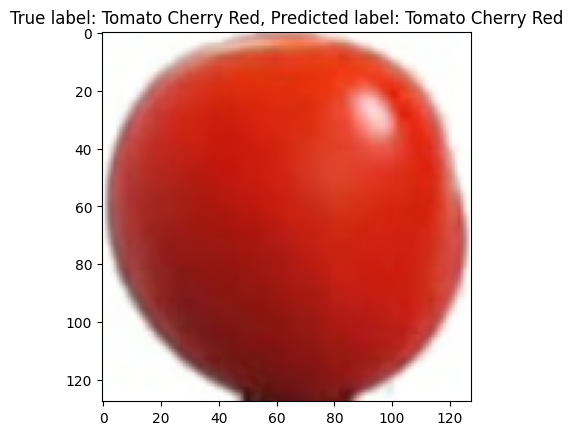

In [ ]:
# Generate predictions using the fine-tuned model
y_pred = fineTuneModel.predict(test_ds)

# Convert predictions to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Get the class names

# Print the images and their corresponding label names
for images, labels in test_ds.take(1):
    for i in range(len(images)):
        plt.imshow(images[i].numpy().astype("uint8"))
        true_label = class_names[labels[i]]
        pred_label = class_names[y_pred_labels[i]]
        plt.title(f"True label: {true_label}, Predicted label: {pred_label}")
        plt.show()

20/20 [==============================] - 1s 30ms/step


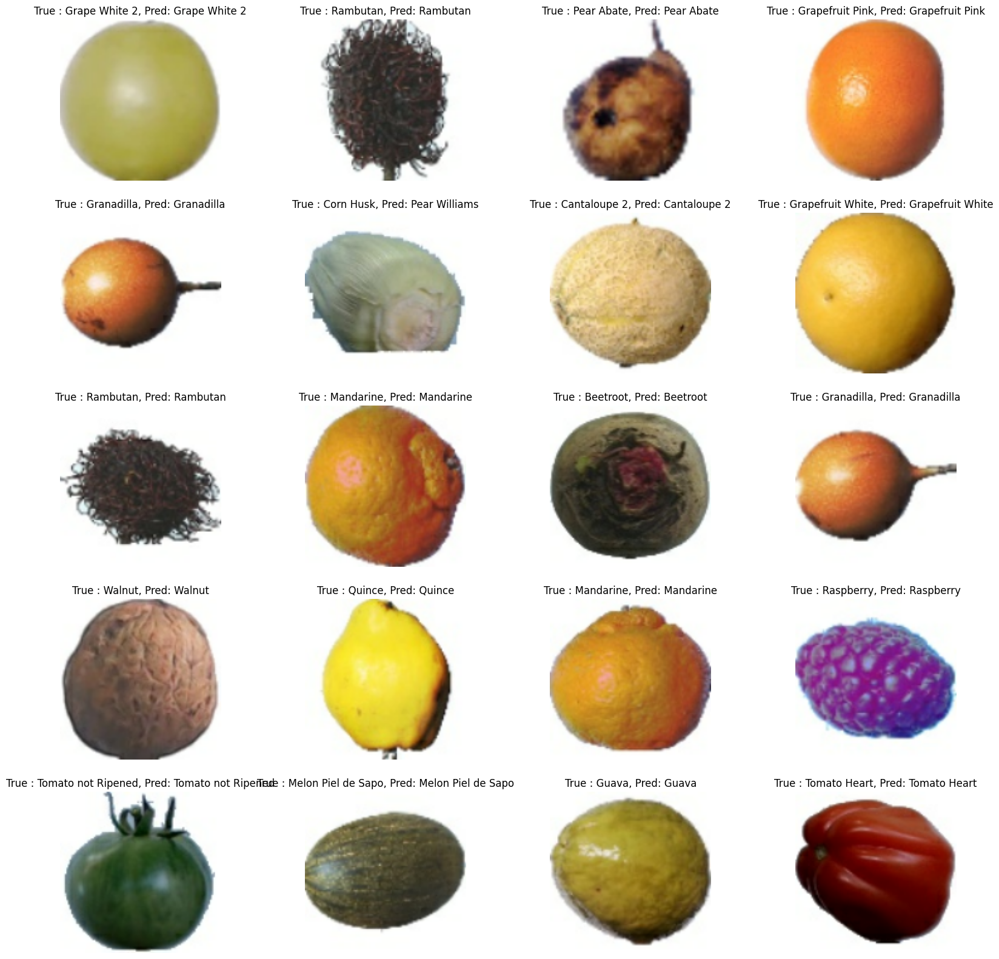

In [ ]:
# Generate predictions using the fine-tuned model
y_pred = fineTuneModel.predict(test_ds)

# Convert predictions to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

import math


# Print the images and their corresponding label names
fig, ax = plt.subplots(nrows=math.ceil(len(test_ds)/4), ncols=4, figsize=(20, 20))
for i, (images, labels) in enumerate(test_ds):
    for j in range(len(images)):
        if i*4+j < len(test_ds):
            row = (i*4+j) // 4
            col = (i*4+j) % 4
            ax[row, col].imshow(images[j].numpy().astype("uint8"))
            true_label = class_names[labels[j]]
            pred_label = class_names[y_pred_labels[i*batch_size+j]]
            ax[row, col].set_title(f"True : {true_label}, Pred: {pred_label}")
            ax[row, col].axis('off')
plt.show()

In [ ]:
tl_model.save('saved_models/efficientnet_v2_transferlearning/', save_format='tf')

In [ ]:
!ls

 drive			    'kaggle (1) (1).json'   resnet_finetunehistory.npy
 efficientNet_finetune.zip  'kaggle (1).json'	    resnet_tl_history.npy
 fruits-360_dataset	    'kaggle (2).json'	    sample_data
 fruits-360-original-size   'kaggle (3).json'	    saved_models
 fruits.zip		     kaggle.json


In [ ]:
!zip efficientNet_finetune.zip -r ./saved_models

updating: saved_models/ (stored 0%)
updating: saved_models/efficientnet_v2_transferlearning/ (stored 0%)
updating: saved_models/efficientnet_v2_transferlearning/fingerprint.pb (stored 0%)
updating: saved_models/efficientnet_v2_transferlearning/saved_model.pb (deflated 92%)
updating: saved_models/efficientnet_v2_transferlearning/variables/ (stored 0%)
updating: saved_models/efficientnet_v2_transferlearning/variables/variables.data-00000-of-00001 (deflated 11%)
updating: saved_models/efficientnet_v2_transferlearning/variables/variables.index (deflated 78%)
updating: saved_models/efficientnet_v2_transferlearning/assets/ (stored 0%)
updating: saved_models/efficientnet_v2_transferlearning/keras_metadata.pb (deflated 96%)
updating: saved_models/efficientnet_v2_finetune/ (stored 0%)
updating: saved_models/efficientnet_v2_finetune/fingerprint.pb (stored 0%)
updating: saved_models/efficientnet_v2_finetune/saved_model.pb (deflated 92%)
updating: saved_models/efficientnet_v2_finetune/variables/ (

In [ ]:
from google.colab import files
files.download('efficientNet_finetune.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>